In [10]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
import os
from sklearn.calibration import LabelEncoder
from PIL import Image


In [11]:
# # Load dataset
# data = pd.read_csv('/Users/shaneab/Projects/Machine Learning/Expression recognition/fer20131.csv')
# X = np.array([np.fromstring(pixel, dtype=int, sep=' ') for pixel in data['pixels']])
# y = data['emotion'].values


In [12]:
images_folder = 'images'

X = []
y = []

for subdir, dirs, files in os.walk(images_folder):
    for file in files:
        if file.endswith(('jpg', 'jpeg', 'png')):
            img_path = os.path.join(subdir, file)
            label = os.path.basename(subdir)
            
            image = Image.open(img_path).convert('L')
            image = image.resize((48, 48))
            X.append(np.array(image).flatten())
            y.append(label)

In [13]:
# Convert lists to NumPy arrays
X = np.array(X)
y = np.array(y)

In [14]:
X.tolist()

[[72,
  78,
  81,
  75,
  59,
  54,
  63,
  61,
  55,
  55,
  62,
  46,
  93,
  114,
  121,
  119,
  115,
  109,
  98,
  90,
  85,
  84,
  90,
  99,
  109,
  127,
  143,
  153,
  161,
  168,
  171,
  171,
  170,
  166,
  127,
  112,
  112,
  107,
  96,
  78,
  64,
  64,
  56,
  57,
  61,
  52,
  43,
  40,
  65,
  62,
  59,
  52,
  58,
  71,
  73,
  73,
  62,
  60,
  54,
  102,
  146,
  154,
  149,
  151,
  157,
  154,
  151,
  149,
  147,
  147,
  152,
  158,
  164,
  171,
  177,
  181,
  186,
  188,
  189,
  191,
  187,
  177,
  168,
  115,
  96,
  104,
  98,
  76,
  73,
  61,
  53,
  58,
  56,
  55,
  52,
  45,
  47,
  42,
  60,
  61,
  62,
  73,
  66,
  64,
  55,
  64,
  117,
  157,
  158,
  169,
  165,
  165,
  167,
  167,
  171,
  173,
  173,
  174,
  178,
  181,
  185,
  186,
  189,
  195,
  199,
  198,
  197,
  198,
  199,
  189,
  193,
  144,
  84,
  100,
  91,
  65,
  59,
  59,
  56,
  52,
  40,
  47,
  54,
  49,
  40,
  43,
  62,
  54,
  45,
  54,
  52,
  56,
  80,
  138,
  1

In [15]:
# Normalize pixel values
X = X / 255.0

In [16]:
# X_scaled = X.reshape(1,-1)

In [17]:
# #Normalisasi Data
# scaler = MinMaxScaler()
# X_scaled = scaler.fit_transform(X)

# X_scaled.tolist()

# Encode labels as integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

In [18]:
# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train


array([[0.54509804, 0.48235294, 0.52156863, ..., 0.09411765, 0.08627451,
        0.14117647],
       [0.81176471, 0.25098039, 0.10588235, ..., 0.84705882, 0.94901961,
        0.99215686],
       [0.40392157, 0.44313725, 0.45490196, ..., 0.7254902 , 0.51372549,
        0.56078431],
       ...,
       [0.30196078, 0.37647059, 0.36078431, ..., 0.27058824, 0.25098039,
        0.25490196],
       [0.18039216, 0.20392157, 0.35294118, ..., 0.0627451 , 0.05882353,
        0.05882353],
       [0.25490196, 0.2627451 , 0.23921569, ..., 0.19215686, 0.29411765,
        0.30980392]])

In [19]:
# # Create the kNN classifier
# knn_model = KNeighborsClassifier(n_neighbors=3)

# # Train the model
# knn_model.fit(X_train, y_train)

param_grid = {'n_neighbors': [1, 3, 5, 7, 9]}
knn_model = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
knn_model.fit(X_train, y_train)
print("Best Parameters:", knn_model.best_params_)

Best Parameters: {'n_neighbors': 1}


In [20]:
# Make Prediciton
best_knn = knn_model.best_estimator_
best_knn
y_pred = best_knn.predict(X_test)
y_pred

array([4, 0, 3, ..., 4, 5, 2])

In [21]:
# Evaluate
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8789968652037617
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.86      0.88      1963
           1       0.84      0.95      0.89       217
           2       0.89      0.87      0.88      2064
           3       0.89      0.87      0.88      3590
           4       0.82      0.89      0.85      2504
           5       0.88      0.87      0.87      2417
           6       0.93      0.93      0.93      1600

    accuracy                           0.88     14355
   macro avg       0.88      0.89      0.88     14355
weighted avg       0.88      0.88      0.88     14355



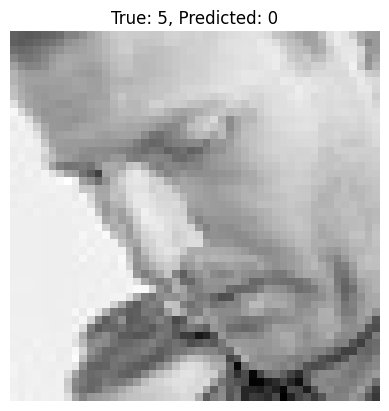

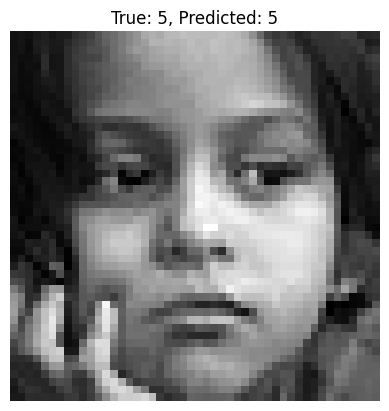

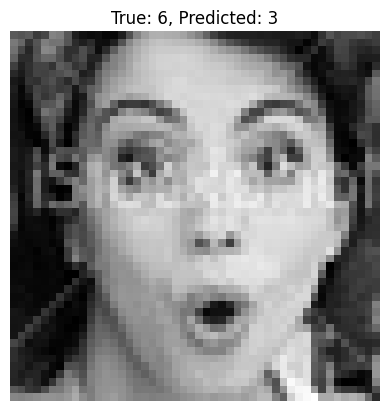

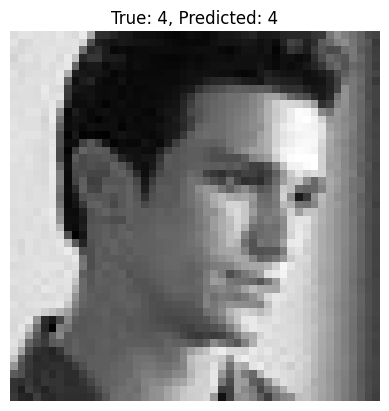

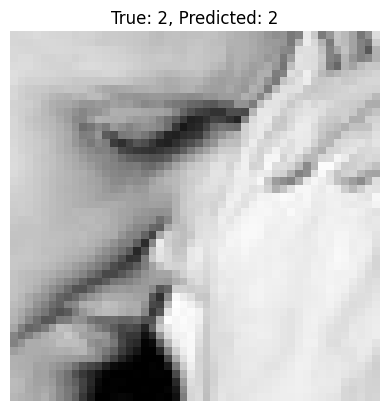

In [22]:
# Visualize random predictions
for i in range(5):
    idx = np.random.randint(0, len(X_test))
    image = X_test[idx].reshape(48, 48)
    plt.imshow(image, cmap='gray')
    plt.title(f"True: {y_test[idx]}, Predicted: {y_pred[idx]}")
    plt.axis('off')
    plt.show()